In [2]:
import cv2
import sys
sys.path.append('..')
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# define

In [128]:
import cv2
import sys
sys.path.append("..")
import torch
import torch.nn as nn
import numpy as np
import configparser
import cv2
import os
import matplotlib.pyplot as plt
from utils.datafit import raw2np, raw2normal
import torch.nn.functional as F
def normalized(data):
    data_normal = (data - data.min())/(data.max() - data.min())
    return data_normal
def raw2cv(file_path):
    data = raw2np(file_path)
    n_data = normalized(data)
    cv_data = np.array(n_data * 255, np.uint8)
    return cv_data
    return decorated
def clip(f):
    def clipInLine(imageNoised):
        # type(img1) == torch.Tensor
        if type(imageNoised) == torch.Tensor:
            imageClip = torch.clamp(imageNoised, 0, 1)
        else:
            imageClip = np.clip(imageNoised, 0, 1) 
        return imageClip
    
    def decorated(*args, **kwargs):
        return clipInLine(f(*args, **kwargs))
class AugmentGaussian:
    '''
    https://github.com/NVlabs/noise2noise/blob/master/train.py
    '''
    def __init__(self, validation_stddev, train_stddev_rng_range):
        self.validation_stddev = validation_stddev
        self.train_stddev_range = train_stddev_rng_range

    def add_train_noise_tf(self, x):
        (minval,maxval) = self.train_stddev_range
        shape = tf.shape(x)
        rng_stddev = tf.random_uniform(shape=[1, 1, 1], minval=minval/255.0, maxval=maxval/255.0)
        return x + tf.random_normal(shape) * rng_stddev
    @clip
    def add_train_noise_torch(self, x):
        (minval,maxval) = self.train_stddev_range
        shape = x.shape
        rng_stddev = torch.rand(1).uniform_(minval/255.0, maxval/255.0)
        return x + torch.randn(shape) * rng_stddev
    # @clip
    def add_validation_noise_np(self, x):
        return (x + np.random.normal(size=x.shape)*(self.validation_stddev/255.0) * 0.6) * 0.6

class FiliterOp(nn.Module):
    def __init__(self, kernel = None, inc = 1, out = 1):
        super().__init__()
        if kernel is None:
            # 高斯
            # kernel = np.array([[1/16, 1/8, 1/16], [1/8, 1/4, 1/8], [1/16, 1/8, 1/16]])
            # laplace 
            # kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
            kernel = np.array([[1/16, 1/8, 1/16], [1/8, 1/4, 1/8], [1/16, 1/8, 1/16]])
        w, h = kernel.shape
        self.kernelSize = (w,h)
        # O = ( W - F + 2P ) / S + 1 
        # O = (O - F + 2P ) /S + 1 # O = W 保持不变
        # O = （O - 3 + 2P）/1 + 1
        # O = O - 3 + 2p + 1
        # p = 1
        #  p = (O(S - 1) - S + F) / 2
        s = 1
        p = (w - s) // 2
        self.filiter = nn.Conv2d(inc, out, w, s, p, groups=inc, bias=False)
        w1 = torch.Tensor(kernel).reshape(1, 1, w, h)
        self.filiter.weight = nn.Parameter(w1)
        self.filiter.requires_grad = False

    @torch.no_grad()
    def forward(self, x):
        #x = F.pad(x, (self.kernelSize[0]//2, self.kernelSize[1]//2, self.kernelSize[0]//2, self.kernelSize[1]//2), mode = 'reflect')
        x = self.filiter(x)
        return x

def medianFilter(image, kernel_size = 3):
    # 使用nn.functional.max_pool2d实现中值滤波  
    return F.max_pool2d(image, kernel_size=kernel_size, stride=1, padding=kernel_size//2)
    #return F.median_filter2d(image, kernel_size)
@torch.no_grad()
def getGaussianKernel(ksize, sigma=0):
    if sigma <= 0:
        # 根据 kernelsize 计算默认的 sigma，和 opencv 保持一致
        sigma = 0.3 * ((ksize - 1) * 0.5 - 1) + 0.8 
    center = ksize // 2
    xs = (np.arange(ksize, dtype=np.float32) - center) # 元素与矩阵中心的横向距离
    kernel1d = np.exp(-(xs ** 2) / (2 * sigma ** 2)) # 计算一维卷积核
    # 根据指数函数性质，利用矩阵乘法快速计算二维卷积核
    kernel = kernel1d[..., None] @ kernel1d[None, ...] 
    kernel = torch.from_numpy(kernel)
    kernel = kernel / kernel.sum() # 归一化
    return kernel
def GaussianBlur(batch_img, ksize, sigma=None):
    kernel = getGaussianKernel(ksize, sigma) # 生成权重
    B, C, H, W = batch_img.shape # C：图像通道数，group convolution 要用到
    # 生成 group convolution 的卷积核
    kernel = kernel.view(1, 1, ksize, ksize).repeat(C, 1, 1, 1)
    pad = (ksize - 1) // 2 # 保持卷积前后图像尺寸不变
    # mode=relfect 更适合计算边缘像素的权重
    batch_img_pad = F.pad(batch_img, pad=[pad, pad, pad, pad], mode='reflect')
    weighted_pix = F.conv2d(batch_img_pad, weight=kernel, bias=None, 
                           stride=1, padding=0, groups=C)
    return weighted_pix

def gamma(img, alpha = 2.3):
    invalpha = 1/alpha
    img = torch.pow(img , invalpha) 
    return img


In [30]:
"""In this module several equalization methods are exposed: he, ahe, clahe."""
import math
from typing import Tuple

import torch
from torch import Tensor
import torch.nn.functional as F

def _torch_histc_cast(input: Tensor, bins: int, min: int, max: int) -> Tensor:
    """Helper function to make torch.histc work with other than fp32/64.

    The function torch.histc is only implemented for fp32/64 which makes impossible to be used by fp16 or others. What
    this function does, is cast input data type to fp32, apply torch.inverse, and cast back to the input dtype.
    """
    if not isinstance(input, Tensor):
        raise AssertionError(f"Input must be Tensor. Got: {type(input)}.")
    dtype: torch.dtype = input.dtype
    if dtype not in (torch.float32, torch.float64):
        dtype = torch.float32
    return torch.histc(input.to(dtype), bins, min, max).to(input.dtype)

def histogram(
    values: torch.Tensor, bins: torch.Tensor, sigma: torch.Tensor, epsilon: float = 1e-10
) -> Tuple[torch.Tensor, torch.Tensor]:
    """Calculate the marginal probability distribution function of the input tensor based on the number of
    histogram bins.

    Args:
        values: shape [BxNx1].
        bins: shape [NUM_BINS].
        sigma: shape [1], gaussian smoothing factor.
        epsilon: scalar, for numerical stability.

    Returns:
        Tuple[torch.Tensor, torch.Tensor]:
          - torch.Tensor: shape [BxN].
          - torch.Tensor: shape [BxNxNUM_BINS].
    """
    if not isinstance(values, torch.Tensor):
        raise TypeError(f"Input values type is not a torch.Tensor. Got {type(values)}")

    if not isinstance(bins, torch.Tensor):
        raise TypeError(f"Input bins type is not a torch.Tensor. Got {type(bins)}")

    if not isinstance(sigma, torch.Tensor):
        raise TypeError(f"Input sigma type is not a torch.Tensor. Got {type(sigma)}")

    if not values.dim() == 3:
        raise ValueError(f"Input values must be a of the shape BxNx1. Got {values.shape}")

    if not bins.dim() == 1:
        raise ValueError(f"Input bins must be a of the shape NUM_BINS. Got {bins.shape}")

    if not sigma.dim() == 0:
        raise ValueError(f"Input sigma must be a of the shape 1. Got {sigma.shape}")

    residuals = values - bins.unsqueeze(0).unsqueeze(0)
    kernel_values = torch.exp(-0.5 * (residuals / sigma).pow(2))

    pdf = torch.mean(kernel_values, dim=1)
    normalization = torch.sum(pdf, dim=1).unsqueeze(1) + epsilon
    pdf = pdf / normalization

    return pdf, kernel_values

def _compute_tiles(
    imgs: torch.Tensor, grid_size: Tuple[int, int], even_tile_size: bool = False
) -> Tuple[torch.Tensor, torch.Tensor]:
    r"""Compute tiles on an image according to a grid size.

    Note that padding can be added to the image in order to crop properly the image.
    So, the grid_size (GH, GW) x tile_size (TH, TW) >= image_size (H, W)

    Args:
        imgs: batch of 2D images with shape (B, C, H, W) or (C, H, W).
        grid_size: number of tiles to be cropped in each direction (GH, GW)
        even_tile_size: Determine if the width and height of the tiles must be even.

    Returns:
        tensor with tiles (B, GH, GW, C, TH, TW). B = 1 in case of a single image is provided.
        tensor with the padded batch of 2D imageswith shape (B, C, H', W').
    """
    batch: torch.Tensor = imgs  # B x C x H x W

    # compute stride and kernel size
    h, w = batch.shape[-2:]
    kernel_vert: int = math.ceil(h / grid_size[0])
    kernel_horz: int = math.ceil(w / grid_size[1])

    if even_tile_size:
        kernel_vert += 1 if kernel_vert % 2 else 0
        kernel_horz += 1 if kernel_horz % 2 else 0

    # add padding (with that kernel size we could need some extra cols and rows...)
    pad_vert = kernel_vert * grid_size[0] - h
    pad_horz = kernel_horz * grid_size[1] - w

    # add the padding in the last coluns and rows
    if pad_vert > batch.shape[-2] or pad_horz > batch.shape[-1]:
        raise ValueError("Cannot compute tiles on the image according to the given grid size")

    if pad_vert > 0 or pad_horz > 0:
        batch = F.pad(batch, [0, pad_horz, 0, pad_vert], mode="reflect")  # B x C x H' x W'

    # compute tiles
    c: int = batch.shape[-3]
    tiles: torch.Tensor = (
        batch.unfold(1, c, c)  # unfold(dimension, size, step)
        .unfold(2, kernel_vert, kernel_vert)
        .unfold(3, kernel_horz, kernel_horz)
        .squeeze(1)
    ).contiguous()  # GH x GW x C x TH x TW

    if tiles.shape[-5] != grid_size[0]:
        raise AssertionError

    if tiles.shape[-4] != grid_size[1]:
        raise AssertionError

    return tiles, batch

def _compute_interpolation_tiles(padded_imgs: torch.Tensor, tile_size: Tuple[int, int]) -> torch.Tensor:
    r"""Compute interpolation tiles on a properly padded set of images.

    Note that images must be padded. So, the tile_size (TH, TW) * grid_size (GH, GW) = image_size (H, W)

    Args:
        padded_imgs: batch of 2D images with shape (B, C, H, W) already padded to extract tiles
                                    of size (TH, TW).
        tile_size: shape of the current tiles (TH, TW).

    Returns:
        tensor with the interpolation tiles (B, 2GH, 2GW, C, TH/2, TW/2).
    """
    if padded_imgs.dim() != 4:
        raise AssertionError("Images Tensor must be 4D.")

    if padded_imgs.shape[-2] % tile_size[0] != 0:
        raise AssertionError("Images are not correctly padded.")

    if padded_imgs.shape[-1] % tile_size[1] != 0:
        raise AssertionError("Images are not correctly padded.")

    # tiles to be interpolated are built by dividing in 4 each already existing
    interp_kernel_vert: int = tile_size[0] // 2
    interp_kernel_horz: int = tile_size[1] // 2

    c: int = padded_imgs.shape[-3]
    interp_tiles: torch.Tensor = (
        padded_imgs.unfold(1, c, c)
        .unfold(2, interp_kernel_vert, interp_kernel_vert)
        .unfold(3, interp_kernel_horz, interp_kernel_horz)
        .squeeze(1)
    ).contiguous()  # 2GH x 2GW x C x TH/2 x TW/2

    if interp_tiles.shape[-3] != c:
        raise AssertionError

    if interp_tiles.shape[-2] != tile_size[0] / 2:
        raise AssertionError

    if interp_tiles.shape[-1] != tile_size[1] / 2:
        raise AssertionError

    return interp_tiles

def _my_histc(tiles: torch.Tensor, bins: int) -> torch.Tensor:
    return _torch_histc_cast(tiles, bins=bins, min=0, max=1)

def _compute_luts(
    tiles_x_im: torch.Tensor, num_bins: int = 256, clip: float = 40.0, diff: bool = False
) -> torch.Tensor:
    r"""Compute luts for a batched set of tiles.

    Same approach as in OpenCV (https://github.com/opencv/opencv/blob/master/modules/imgproc/src/clahe.cpp)

    Args:
        tiles_x_im: set of tiles per image to apply the lut. (B, GH, GW, C, TH, TW)
        num_bins: number of bins. default: 256
        clip: threshold value for contrast limiting. If it is 0 then the clipping is disabled.
        diff: denote if the differentiable histagram will be used. Default: False

    Returns:
        Lut for each tile (B, GH, GW, C, 256).
    """
    if tiles_x_im.dim() != 6:
        raise AssertionError("Tensor must be 6D.")

    b, gh, gw, c, th, tw = tiles_x_im.shape
    pixels: int = th * tw
    tiles: torch.Tensor = tiles_x_im.view(-1, pixels)  # test with view  # T x (THxTW)
    if not diff:
        if torch.jit.is_scripting():
            histos = torch.stack([_torch_histc_cast(tile, bins=num_bins, min=0, max=1) for tile in tiles])
        else:
            histos = torch.stack(list(map(_my_histc, tiles, [num_bins] * len(tiles))))
    else:
        bins: torch.Tensor = torch.linspace(0, 1, num_bins, device=tiles.device)
        histos = histogram(tiles, bins, torch.tensor(0.001)).squeeze()
        histos *= pixels

    if clip > 0.0:
        max_val: float = max(clip * pixels // num_bins, 1)
        histos.clamp_(max=max_val)
        clipped: torch.Tensor = pixels - histos.sum(1)
        residual: torch.Tensor = torch.remainder(clipped, num_bins)
        redist: torch.Tensor = (clipped - residual).div(num_bins)
        histos += redist[None].transpose(0, 1)
        # trick to avoid using a loop to assign the residual
        v_range: torch.Tensor = torch.arange(num_bins, device=histos.device)
        mat_range: torch.Tensor = v_range.repeat(histos.shape[0], 1)
        histos += mat_range < residual[None].transpose(0, 1)

    lut_scale: float = (num_bins - 1) / pixels
    luts: torch.Tensor = torch.cumsum(histos, 1) * lut_scale
    luts = luts.clamp(0, num_bins - 1)
    if not diff:
        luts = luts.floor()  # to get the same values as converting to int maintaining the type
    luts = luts.view((b, gh, gw, c, num_bins))
    return luts

def _map_luts(interp_tiles: torch.Tensor, luts: torch.Tensor) -> torch.Tensor:
    r"""Assign the required luts to each tile.

    Args:
        interp_tiles: set of interpolation tiles. (B, 2GH, 2GW, C, TH/2, TW/2)
        luts: luts for each one of the original tiles. (B, GH, GW, C, 256)

    Returns:
         mapped luts (B, 2GH, 2GW, 4, C, 256)
    """
    if interp_tiles.dim() != 6:
        raise AssertionError("interp_tiles tensor must be 6D.")

    if luts.dim() != 5:
        raise AssertionError("luts tensor must be 5D.")

    # gh, gw -> 2x the number of tiles used to compute the histograms
    # th, tw -> /2 the sizes of the tiles used to compute the histograms
    num_imgs, gh, gw, c, _, _ = interp_tiles.shape

    # precompute idxs for non corner regions (doing it in cpu seems slightly faster)
    j_idxs = torch.empty(0, 4, dtype=torch.long)
    if gh > 2:
        j_floor = torch.arange(1, gh - 1).view(gh - 2, 1).div(2, rounding_mode="trunc")
        j_idxs = torch.tensor([[0, 0, 1, 1], [-1, -1, 0, 0]] * ((gh - 2) // 2))  # reminder + j_idxs[:, 0:2] -= 1
        j_idxs += j_floor

    i_idxs = torch.empty(0, 4, dtype=torch.long)
    if gw > 2:
        i_floor = torch.arange(1, gw - 1).view(gw - 2, 1).div(2, rounding_mode="trunc")
        i_idxs = torch.tensor([[0, 1, 0, 1], [-1, 0, -1, 0]] * ((gw - 2) // 2))  # reminder + i_idxs[:, [0, 2]] -= 1
        i_idxs += i_floor

    # selection of luts to interpolate each patch
    # create a tensor with dims: interp_patches height and width x 4 x num channels x bins in the histograms
    # the tensor is init to -1 to denote non init hists
    luts_x_interp_tiles: torch.Tensor = torch.full(  # B x GH x GW x 4 x C x 256
        (num_imgs, gh, gw, 4, c, luts.shape[-1]), -1, dtype=interp_tiles.dtype, device=interp_tiles.device
    )
    # corner regions
    luts_x_interp_tiles[:, 0 :: gh - 1, 0 :: gw - 1, 0] = luts[:, 0 :: max(gh // 2 - 1, 1), 0 :: max(gw // 2 - 1, 1)]
    # border region (h)
    luts_x_interp_tiles[:, 1:-1, 0 :: gw - 1, 0] = luts[:, j_idxs[:, 0], 0 :: max(gw // 2 - 1, 1)]
    luts_x_interp_tiles[:, 1:-1, 0 :: gw - 1, 1] = luts[:, j_idxs[:, 2], 0 :: max(gw // 2 - 1, 1)]
    # border region (w)
    luts_x_interp_tiles[:, 0 :: gh - 1, 1:-1, 0] = luts[:, 0 :: max(gh // 2 - 1, 1), i_idxs[:, 0]]
    luts_x_interp_tiles[:, 0 :: gh - 1, 1:-1, 1] = luts[:, 0 :: max(gh // 2 - 1, 1), i_idxs[:, 1]]
    # internal region
    luts_x_interp_tiles[:, 1:-1, 1:-1, :] = luts[
        :, j_idxs.repeat(max(gh - 2, 1), 1, 1).permute(1, 0, 2), i_idxs.repeat(max(gw - 2, 1), 1, 1)
    ]

    return luts_x_interp_tiles

def _compute_equalized_tiles(interp_tiles: torch.Tensor, luts: torch.Tensor) -> torch.Tensor:
    r"""Equalize the tiles.

    Args:
        interp_tiles: set of interpolation tiles, values must be in the range [0, 1].
          (B, 2GH, 2GW, C, TH/2, TW/2)
        luts: luts for each one of the original tiles. (B, GH, GW, C, 256)

    Returns:
        equalized tiles (B, 2GH, 2GW, C, TH/2, TW/2)
    """
    if interp_tiles.dim() != 6:
        raise AssertionError("interp_tiles tensor must be 6D.")

    if luts.dim() != 5:
        raise AssertionError("luts tensor must be 5D.")

    mapped_luts: torch.Tensor = _map_luts(interp_tiles, luts)  # Bx2GHx2GWx4xCx256

    # gh, gw -> 2x the number of tiles used to compute the histograms
    # th, tw -> /2 the sizes of the tiles used to compute the histograms
    num_imgs, gh, gw, c, th, tw = interp_tiles.shape

    # equalize tiles
    flatten_interp_tiles: torch.Tensor = (interp_tiles * 255).long().flatten(-2, -1)  # B x GH x GW x 4 x C x (THxTW)
    flatten_interp_tiles = flatten_interp_tiles.unsqueeze(-3).expand(num_imgs, gh, gw, 4, c, th * tw)
    print( mapped_luts.shape, flatten_interp_tiles.shape )
    preinterp_tiles_equalized = (
        torch.gather(mapped_luts, 5, flatten_interp_tiles)  # B x GH x GW x 4 x C x TH x TW
        .to(interp_tiles)
        .reshape(num_imgs, gh, gw, 4, c, th, tw)
    )

    # interp tiles
    tiles_equalized: torch.Tensor = torch.zeros_like(interp_tiles)

    # compute the interpolation weights (shapes are 2 x TH x TW because they must be applied to 2 interp tiles)
    ih = (
        torch.arange(2 * th - 1, -1, -1, dtype=interp_tiles.dtype, device=interp_tiles.device)
        .div(2.0 * th - 1)[None]
        .transpose(-2, -1)
        .expand(2 * th, tw)
    )
    ih = ih.unfold(0, th, th).unfold(1, tw, tw)  # 2 x 1 x TH x TW
    iw = (
        torch.arange(2 * tw - 1, -1, -1, dtype=interp_tiles.dtype, device=interp_tiles.device)
        .div(2.0 * tw - 1)
        .expand(th, 2 * tw)
    )
    iw = iw.unfold(0, th, th).unfold(1, tw, tw)  # 1 x 2 x TH x TW

    # compute row and column interpolation weights
    tiw = iw.expand((gw - 2) // 2, 2, th, tw).reshape(gw - 2, 1, th, tw).unsqueeze(0)  # 1 x GW-2 x 1 x TH x TW
    tih = ih.repeat((gh - 2) // 2, 1, 1, 1).unsqueeze(1)  # GH-2 x 1 x 1 x TH x TW

    # internal regions
    tl, tr, bl, br = preinterp_tiles_equalized[:, 1:-1, 1:-1].unbind(3)
    t = torch.addcmul(tr, tiw, torch.sub(tl, tr))
    b = torch.addcmul(br, tiw, torch.sub(bl, br))
    tiles_equalized[:, 1:-1, 1:-1] = torch.addcmul(b, tih, torch.sub(t, b))

    # corner regions
    tiles_equalized[:, 0 :: gh - 1, 0 :: gw - 1] = preinterp_tiles_equalized[:, 0 :: gh - 1, 0 :: gw - 1, 0]

    # border region (h)
    t, b, _, _ = preinterp_tiles_equalized[:, 1:-1, 0].unbind(2)
    tiles_equalized[:, 1:-1, 0] = torch.addcmul(b, tih.squeeze(1), torch.sub(t, b))
    t, b, _, _ = preinterp_tiles_equalized[:, 1:-1, gh - 1].unbind(2)
    tiles_equalized[:, 1:-1, gh - 1] = torch.addcmul(b, tih.squeeze(1), torch.sub(t, b))

    # border region (w)
    left, right, _, _ = preinterp_tiles_equalized[:, 0, 1:-1].unbind(2)
    tiles_equalized[:, 0, 1:-1] = torch.addcmul(right, tiw, torch.sub(left, right))
    left, right, _, _ = preinterp_tiles_equalized[:, gw - 1, 1:-1].unbind(2)
    tiles_equalized[:, gw - 1, 1:-1] = torch.addcmul(right, tiw, torch.sub(left, right))

    # same type as the input
    return tiles_equalized.div(255.0)

def equalize_clahe(
    input: torch.Tensor,
    clip_limit: float = 40.0,
    grid_size: Tuple[int, int] = (8, 8),
    slow_and_differentiable: bool = False,
) -> torch.Tensor:
    r"""Apply clahe equalization on the input tensor.

    .. image:: _static/img/equalize_clahe.png

    NOTE: Lut computation uses the same approach as in OpenCV, in next versions this can change.

    Args:
        input: images tensor to equalize with values in the range [0, 1] and shape :math:`(*, C, H, W)`.
        clip_limit: threshold value for contrast limiting. If 0 clipping is disabled.
        grid_size: number of tiles to be cropped in each direction (GH, GW).
        slow_and_differentiable: flag to select implementation

    Returns:
        Equalized image or images with shape as the input.

    Examples:
        >>> img = torch.rand(1, 10, 20)
        >>> res = equalize_clahe(img)
        >>> res.shape
        torch.Size([1, 10, 20])

        >>> img = torch.rand(2, 3, 10, 20)
        >>> res = equalize_clahe(img)
        >>> res.shape
        torch.Size([2, 3, 10, 20])
    """
    if not isinstance(clip_limit, float):
        raise TypeError(f"Input clip_limit type is not float. Got {type(clip_limit)}")

    if not isinstance(grid_size, tuple):
        raise TypeError(f"Input grid_size type is not Tuple. Got {type(grid_size)}")

    if len(grid_size) != 2:
        raise TypeError(f"Input grid_size is not a Tuple with 2 elements. Got {len(grid_size)}")

    if isinstance(grid_size[0], float) or isinstance(grid_size[1], float):
        raise TypeError("Input grid_size type is not valid, must be a Tuple[int, int].")

    if grid_size[0] <= 0 or grid_size[1] <= 0:
        raise ValueError(f"Input grid_size elements must be positive. Got {grid_size}")

    imgs: torch.Tensor = input  # B x C x H x W

    # hist_tiles: torch.Tensor  # B x GH x GW x C x TH x TW  # not supported by JIT
    # img_padded: torch.Tensor  # B x C x H' x W'  # not supported by JIT
    # the size of the tiles must be even in order to divide them into 4 tiles for the interpolation
    hist_tiles, img_padded = _compute_tiles(imgs, grid_size, True)
    tile_size: Tuple[int, int] = (hist_tiles.shape[-2], hist_tiles.shape[-1])
    interp_tiles: torch.Tensor = _compute_interpolation_tiles(img_padded, tile_size)  # B x 2GH x 2GW x C x TH/2 x TW/2
    luts: torch.Tensor = _compute_luts(
        hist_tiles, clip=clip_limit, diff=slow_and_differentiable
    )  # B x GH x GW x C x 256
    equalized_tiles: torch.Tensor = _compute_equalized_tiles(interp_tiles, luts)  # B x 2GH x 2GW x C x TH/2 x TW/2

    # reconstruct the images form the tiles
    #    try permute + contiguous + view
    eq_imgs: torch.Tensor = equalized_tiles.permute(0, 3, 1, 4, 2, 5).reshape_as(img_padded)
    h, w = imgs.shape[-2:]
    eq_imgs = eq_imgs[..., :h, :w]  # crop imgs if they were padded

    # remove batch if the input was not in batch form
    if input.dim() != eq_imgs.dim():
        eq_imgs = eq_imgs.squeeze(0)

    return eq_imgs

class CLAHE(nn.Module): 
    """
    param: clip_limit = 40.0, grid_size = (14,14) # grid size 越小越快 效果差 近似于 直方图均值化
    """
    def __init__(self,  clipLimit = 40, gridSize = ( 14, 14)): 
        super().__init__() 
        self.gridSize = gridSize
        self.clipLimit = clipLimit
        self.slow_and_differentiable = False
        self.checkParam()

    def checkParam(self):
        gridSize = self.gridSize
        clipLimit = self.clipLimit
        if not isinstance(clipLimit, float):
            raise TypeError(f"Input clipLimit type is not float. Got {type(clipLimit)}")

        if not isinstance(gridSize, tuple):
            raise TypeError(f"Input gridSize type is not Tuple. Got {type(gridSize)}")

        if len(gridSize) != 2:
            raise TypeError(f"Input gridSize is not a Tuple with 2 elements. Got {len(gridSize)}")

        if isinstance(gridSize[0], float) or isinstance(gridSize[1], float):
            raise TypeError("Input gridSize type is not valid, must be a Tuple[int, int].")

        if gridSize[0] <= 0 or gridSize[1] <= 0:
            raise ValueError(f"Input gridSize elements must be positive. Got {gridSize}")

    @torch.no_grad
    def forward(self , image):
        imgs: torch.Tensor = image  # B x C x H x W
        # histTiles: torch.Tensor  # B x GH x GW x C x TH x TW  # not supported by JIT
        # img_Padded: torch.Tensor  # B x C x H' x W'  # not supported by JIT
        # the size of the tiles must be even in order to divide them into 4 tiles for the interpolation
        histTiles, img_Padded = _compute_tiles(imgs, self.gridSize, True)
        tile_size: Tuple[int, int] = (histTiles.shape[-2], histTiles.shape[-1])
        interp_tiles: torch.Tensor = _compute_interpolation_tiles(img_Padded, tile_size)  # B x 2GH x 2GW x C x TH/2 x TW/2
        luts: torch.Tensor = _compute_luts(
            histTiles, clip = self.clipLimit, diff = self.slow_and_differentiable
        )  # B x GH x GW x C x 256
        equalizedTiles: torch.Tensor = _compute_equalized_tiles(interp_tiles, luts)  # B x 2GH x 2GW x C x TH/2 x TW/2

        # reconstruct the images form the tiles
        #    try permute + contiguous + view
        eqImgs: torch.Tensor = equalizedTiles.permute(0, 3, 1, 4, 2, 5).reshape_as(img_Padded)
        h, w = imgs.shape[-2:]
        eqImgs = eqImgs[..., :h, :w]  # crop imgs if they were padded

        # remove batch if the input was not in batch form
        if image.dim() != eqImgs.dim():
            eqImgs = eqImgs.squeeze(0)

        return eqImgs

In [31]:
def equ_his(gray_img_arr):
    """
    直方图均值化处理
    param gray_img_arr: 待均值化图 数据范围 0 - 1 之间
    return: 均值化后的图像
    """
    hist, bins = np.histogram(gray_img_arr.flatten(), 256, [0,1])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    equalized_img_arr = np.interp(gray_img_arr.flatten(), bins[:-1], cdf_normalized).reshape(gray_img_arr.shape)
    normal = normalized(equalized_img_arr)
    return normal

def gamma(img, alpha = 2.3):
    invalpha = 1/alpha
    img = torch.pow(img , invalpha) 
    return img

# read image

In [5]:
kernel = getGaussianKernel(5)
guassf = FiliterOp(kernel)

In [25]:
file_path = r'D:\dataset\fussen\kunlun2\60-4-1\1.2.826.0.1.3680043.2.461.14085263.610332026.raw'

In [26]:
ans = raw2normal(file_path)

## now

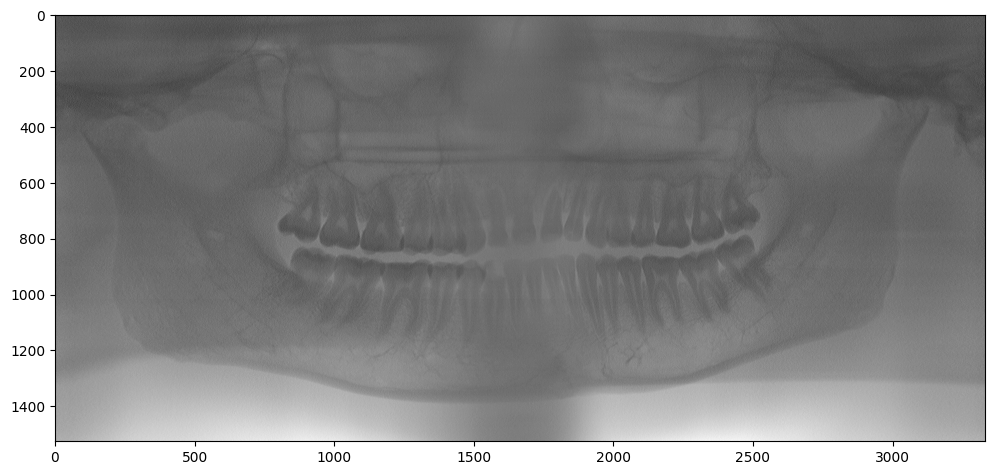

In [66]:
plt.figure(figsize = (12,12))
plt.imshow(ans, cmap = 'gray')
plt.show()

## target

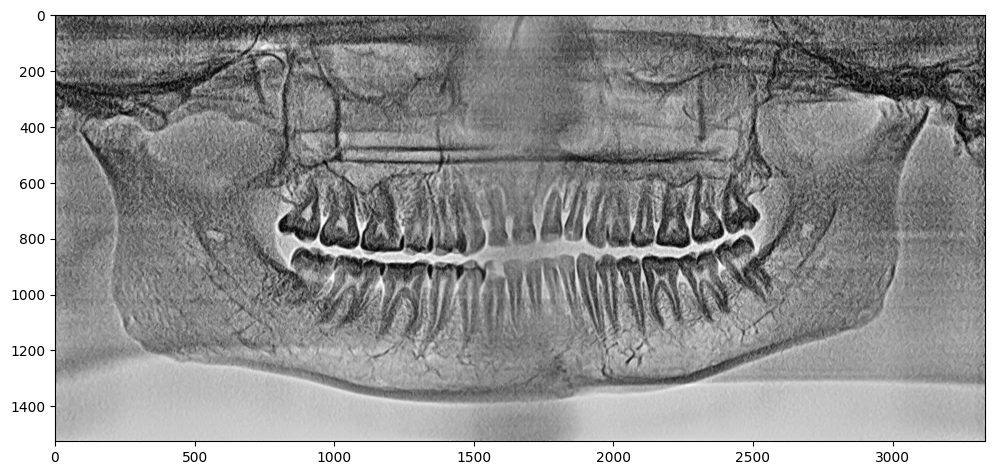

In [6]:
path = r"D:\dataset\fussen\kunlun2\60-4-1\Result/1.2.826.0.1.3680043.2.461.14085263.610332026.raw"
img = raw2normal(path)
plt.figure(figsize=(12,12))
plt.imshow(img, cmap = 'gray')
plt.show()

# define laplace py

In [74]:
guassFiliter = FiliterOp()
avgFiliter = FiliterOp(kernel = 1/9 * np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]]))
down = nn.Upsample(scale_factor=0.5)
up = nn.Upsample(scale_factor=2, mode='bicubic')

In [75]:
image_origin = torch.from_numpy( ans ).unsqueeze(0).unsqueeze(0).to(torch.float32)
image_origin = F.interpolate(image_origin, size=(512*2,512*4),mode='bicubic',align_corners=True)

In [81]:
image = torch.from_numpy( ans ).unsqueeze(0).unsqueeze(0).to(torch.float32)
image = F.interpolate(image, size=(512*2,512*4),mode='bicubic',align_corners=True)
image_elahe = equalize_clahe(image, grid_size = (12,12))

torch.Size([1, 24, 24, 4, 1, 256]) torch.Size([1, 24, 24, 4, 1, 3698])


In [82]:
image_list = []
# image = GaussianBlur(image, 3, 0)
image = normalized(log10(image))

#image = GaussianBlur(image, 3, 0)
image_list.append(image)
for i in range(4):
    image = GaussianBlur(image, 3, 0)# guassFiliter(image)
    #image = image[:,:,1:-1, 1:-1]
    print(image.shape)
    # image =  down(image)#  #
    image = image[ :, :, ::2, ::2]
    image_list.append(image)

image = image_list[-1]
laplace_list = []
for i in range( 4, 0,-1):
    i -= 1
    image = up(image)
    laplace_list.append(image_list[i] - image)

torch.Size([1, 1, 1024, 2048])
torch.Size([1, 1, 512, 1024])
torch.Size([1, 1, 256, 512])
torch.Size([1, 1, 128, 256])


In [83]:
image = image_list[-1]
for i in laplace_list:
    image = up(image) + guassFiliter(i)
image = normalized(image)
image = equalize_clahe(image, grid_size = (12,12))


torch.Size([1, 24, 24, 4, 1, 256]) torch.Size([1, 24, 24, 4, 1, 3698])


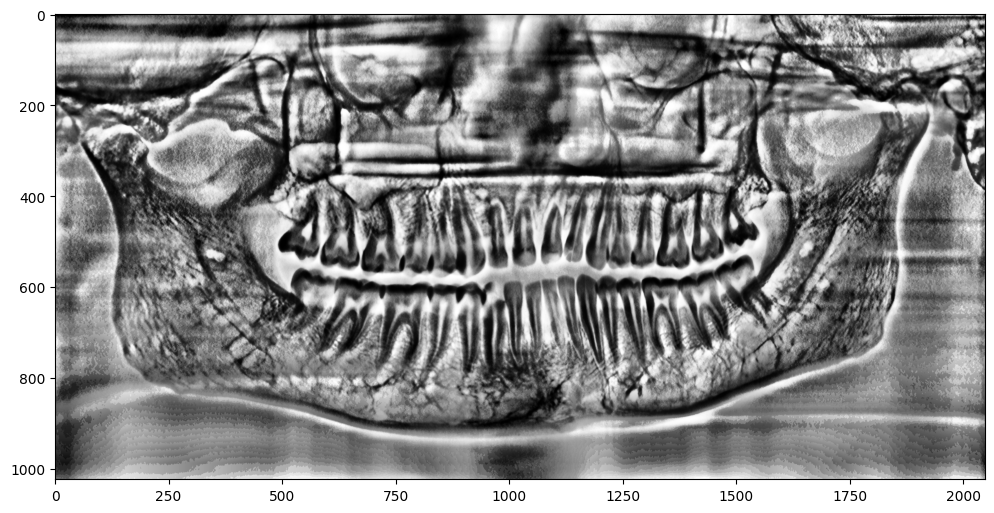

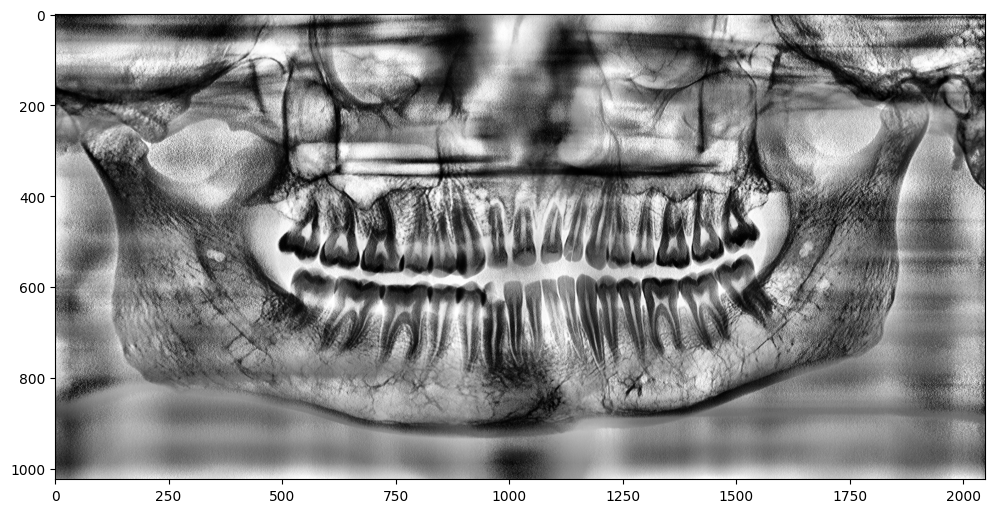

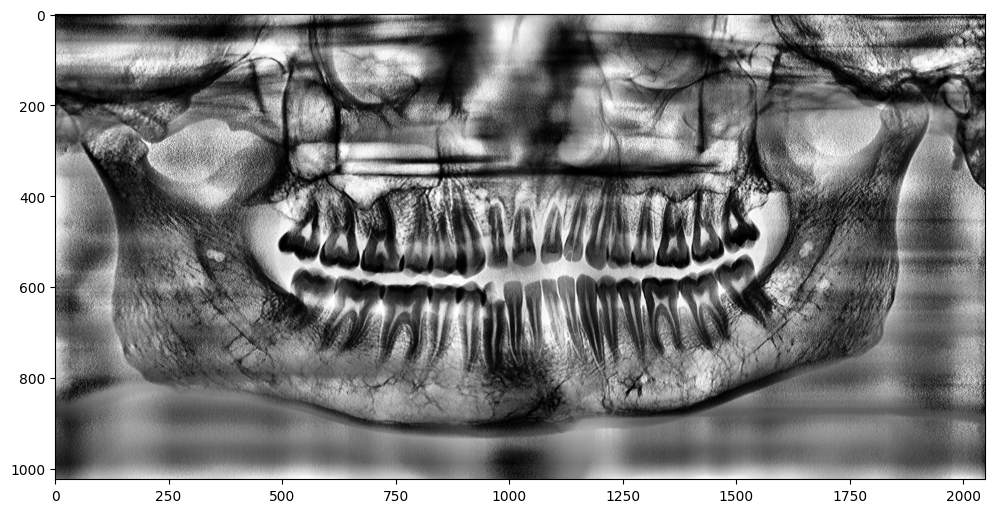

In [93]:
plt.figure(figsize = (12,12))
plt.imshow( image.squeeze(), cmap = 'gray')
plt.show()
plt.figure(figsize = (12,12))
plt.imshow(image_elahe.squeeze(), cmap = 'gray')
plt.show()
plt.figure(figsize = (12,12))
plt.imshow(  normalized(gamma(image_elahe,0.8)).squeeze(), cmap = 'gray')
plt.show()

In [213]:
cdf_normalized, bins

NameError: name 'cdf_normalized' is not defined

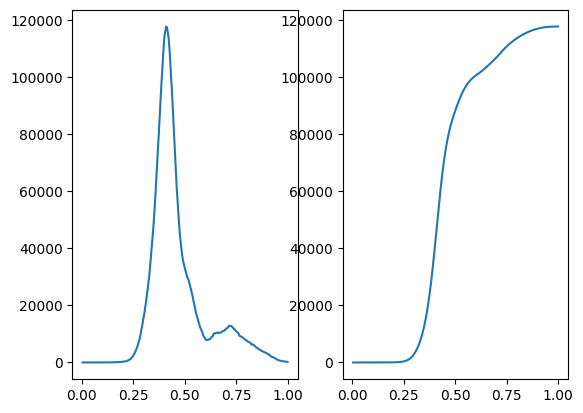

In [136]:
plt.subplot(121)
plt.plot(bins[1:], hist)
plt.subplot(122)
plt.plot(bins[1:], cdf_normalized)
plt.show()

In [160]:
hist, bins = torch.histogram(image, 256, range = [0,1])
cdf = torch.cumsum(hist, 0)
cdf_normalized = cdf * hist.max() / cdf.max()
# image_cdf_normal = F.interpolate( image.flatten().unsqueeze(0).unsqueeze(0), scale_factor=cdf_normalized)

In [162]:
hist.shape, bins.shape

(torch.Size([256]), torch.Size([257]))

In [18]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(cv2.equalizeHist( np.array(image_origin.squeeze().numpy() * 255, dtype = np.uint8)))

In [29]:
image_origin = torch.from_numpy(ans).unsqueeze(0).unsqueeze(0).to(torch.float32)
image_origin.shape

torch.Size([1, 1, 1526, 3331])

In [30]:
img_ans = equalize_clahe((image_origin))
# img_ans = guassf(img_ans)

torch.Size([1, 16, 16, 4, 1, 256]) torch.Size([1, 16, 16, 4, 1, 20064])


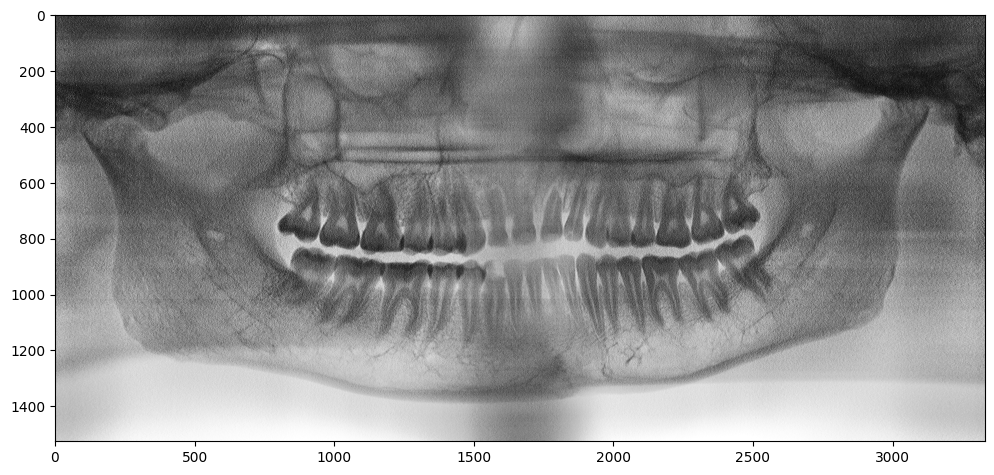

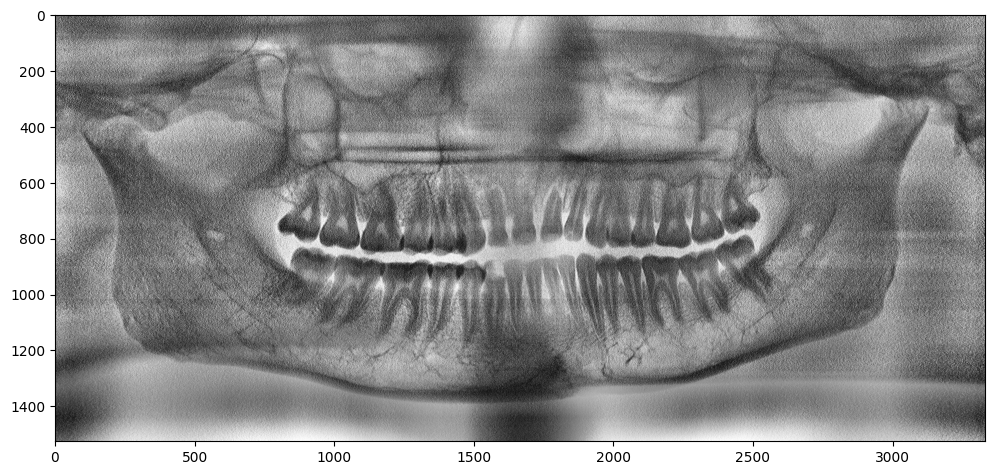

In [19]:
plt.figure(figsize=(12,12))
plt.imshow(cl1, cmap = 'gray')
plt.show()
plt.figure(figsize=(12,12))
plt.imshow(img_ans.squeeze(), cmap = 'gray')
plt.show()

In [69]:
img_ans = equalize_clahe(normalized(image))

torch.Size([1, 16, 16, 4, 1, 256]) torch.Size([1, 16, 16, 4, 1, 8192])


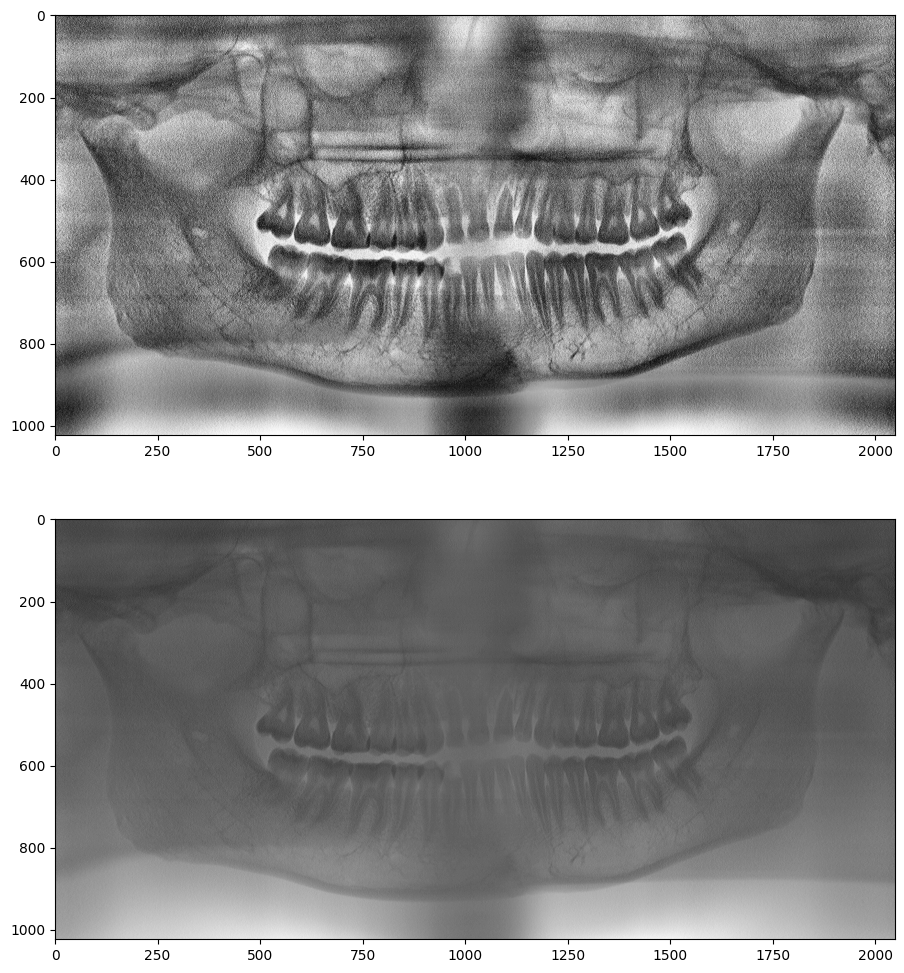

In [70]:
plt.figure(figsize=(12,12))
plt.subplot(211)
plt.imshow(img_ans.squeeze().numpy(), cmap='gray')
plt.subplot(212)
plt.imshow(image.squeeze().numpy(), cmap='gray')
plt.show()

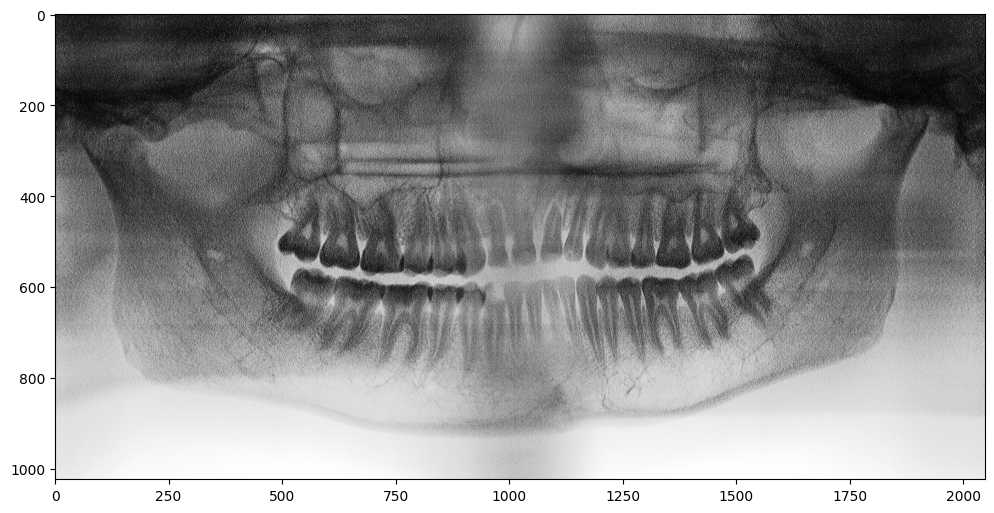

In [68]:
plt.figure(figsize=(12,12))
plt.imshow(equ_his(image.squeeze().numpy()), cmap = 'gray')
plt.show()

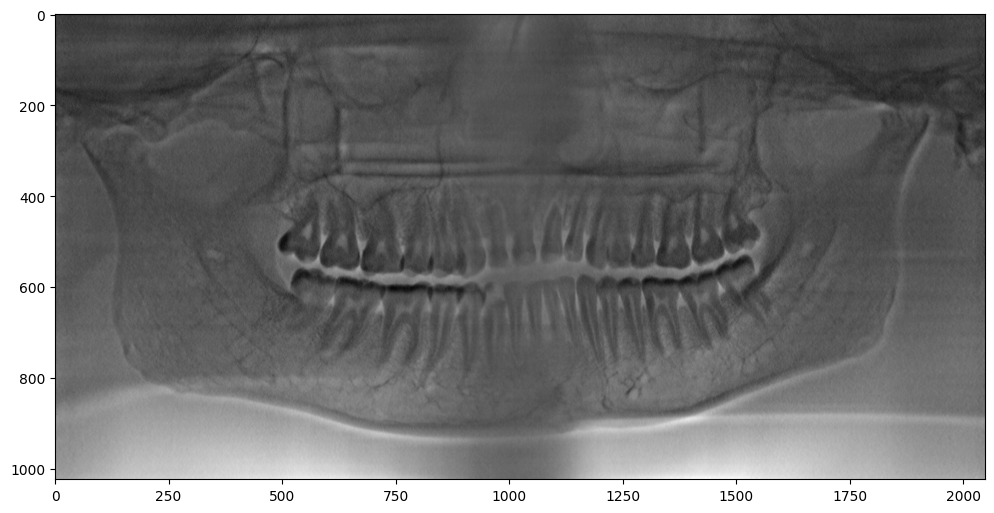

In [316]:
plt.figure(figsize=(12,12))
plt.imshow(image.squeeze(), cmap = 'gray')
plt.show()

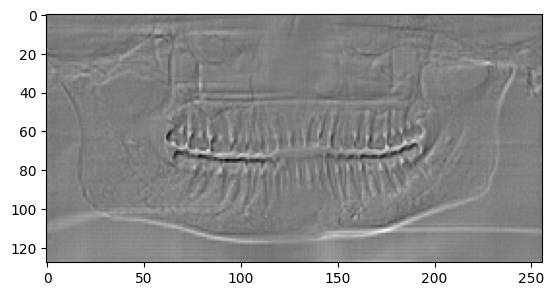

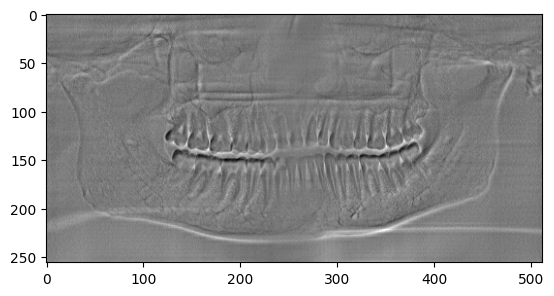

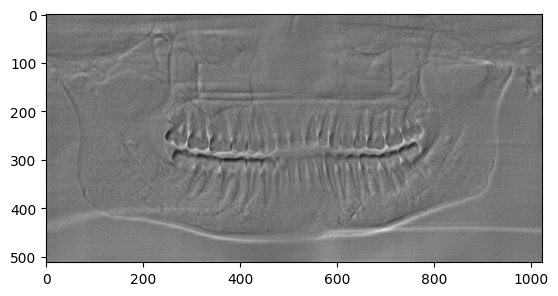

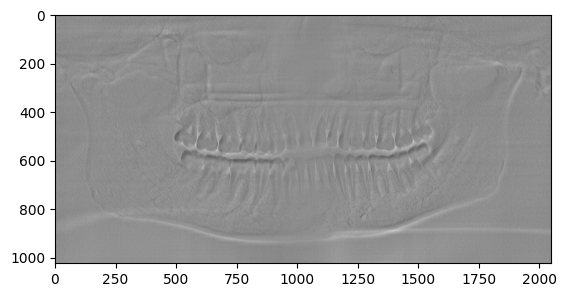

In [317]:
for i in laplace_list:
    plt.imshow(i.squeeze(), cmap = 'gray')
    plt.show()

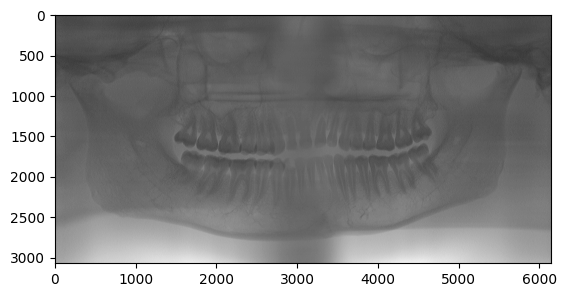

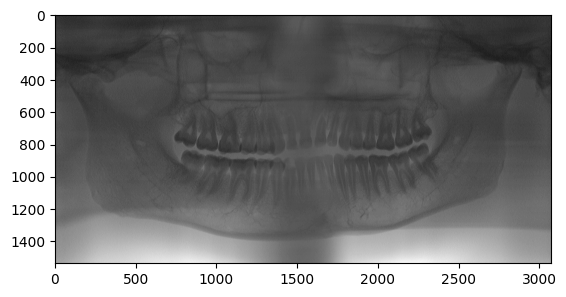

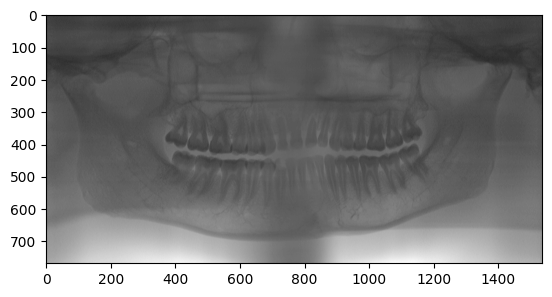

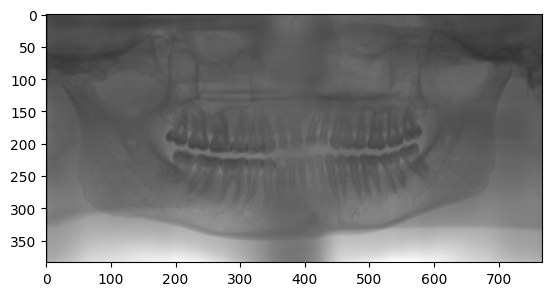

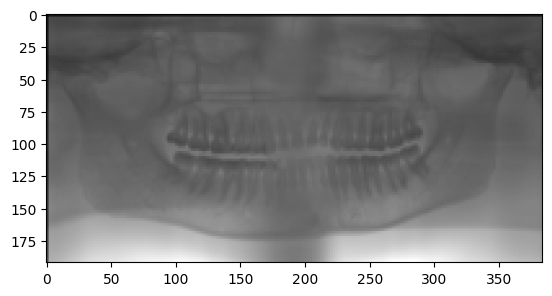

In [72]:
for i in image_up_list:
    plt.imshow(i.squeeze(), cmap = 'gray')
    plt.show()

In [ ]:
image_lower = image_list[-1]

In [ ]:
image_lower

In [ ]:
def build_laplace_pyramid( image, pyramid_number = 4): # 0 - 1
    image_list = []
    image_list.append(image)
    for i in range(pyramid_number):
        image = guassFiliter(image)
        image =  image[ :, :, ::2, ::2]
        image_list.append(image)
        
    
    

# test CLAHE

In [127]:
from model.pre.clahe import CLAHE
from utils.datafit import raw2np, raw2normal
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

In [129]:
enchance = CLAHE(40.0, (14,14))

In [181]:
file_path = r'D:\dataset\fussen\kunlun2\60-4-1\1.2.826.0.1.3680043.2.461.14085263.610332026.raw'
file_path = r'D:\dataset\fussen\kunlun2\100-9-1\1.2.826.0.1.3680043.2.461.14085266.2487872269.raw'
file_path = r'D:\dataset\fussen\kunlun2\90-7-2\1.2.826.0.1.3680043.2.461.14085258.2910576680.raw'
ans = raw2normal(file_path)
image = torch.from_numpy( ans ).unsqueeze(0).unsqueeze(0).to(torch.float32)

image = enchance(image)
#image = normalized(loge(image))

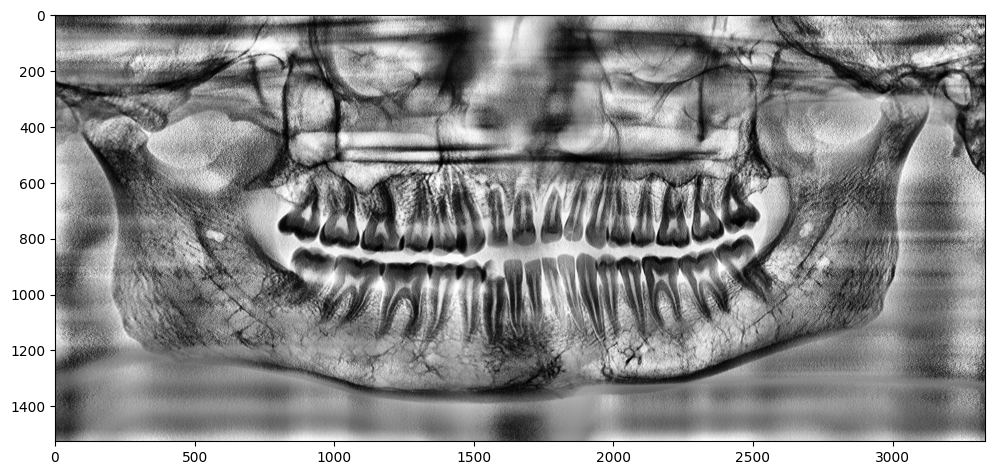

In [182]:
plt.figure(figsize =(12,12))
plt.imshow(image.squeeze(), cmap = 'gray')
plt.show()

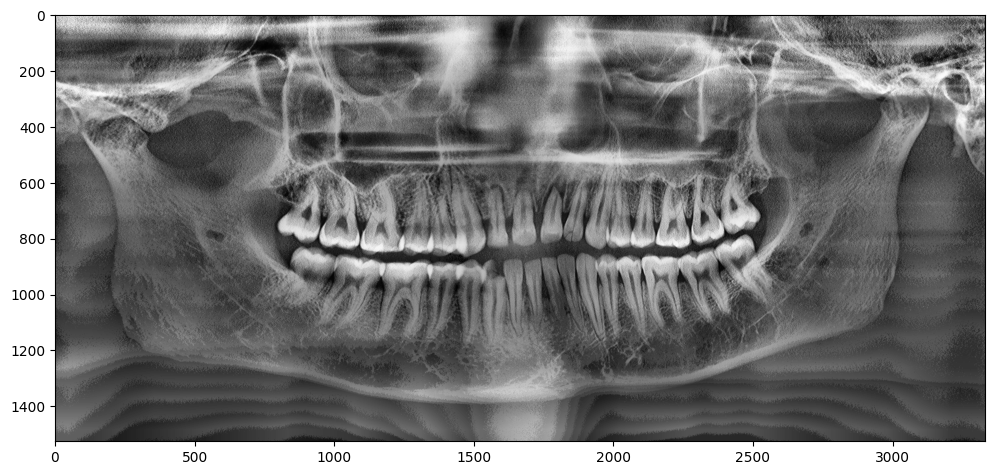

In [174]:
plt.figure(figsize =(12,12))
plt.imshow(1-image.squeeze(), cmap = 'gray')
plt.show()

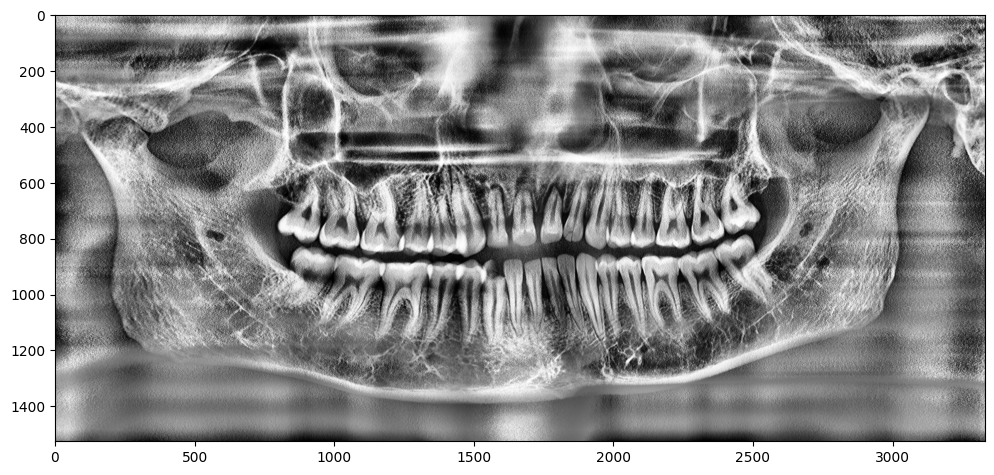

In [21]:
plt.figure(figsize =(12,12))
plt.imshow(1-image.squeeze(), cmap = 'gray')
plt.show()

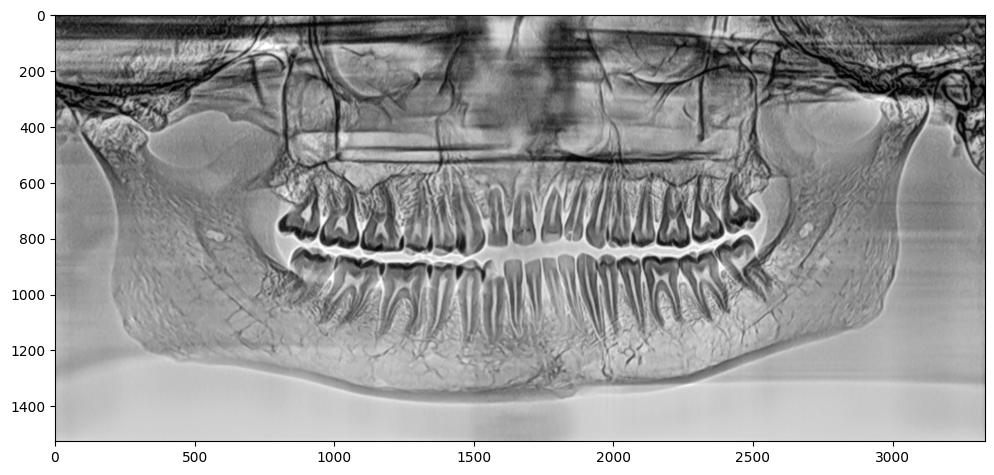

In [26]:
path = r"D:\dataset\fussen\kunlun2\60-4-1\Result/1.2.826.0.1.3680043.2.461.14085263.610332026.raw"
path = r'D:\dataset\fussen\kunlun2\90-7-2\Result/1.2.826.0.1.3680043.2.461.14085258.2910576680.raw'
path = r'D:\dataset\fussen\kunlun2\100-9-2\Result/1.2.826.0.1.3680043.2.461.14085253.3515251556.raw'
img = raw2normal(path)
plt.figure(figsize=(12,12))
plt.imshow(img, cmap = 'gray')
plt.show()

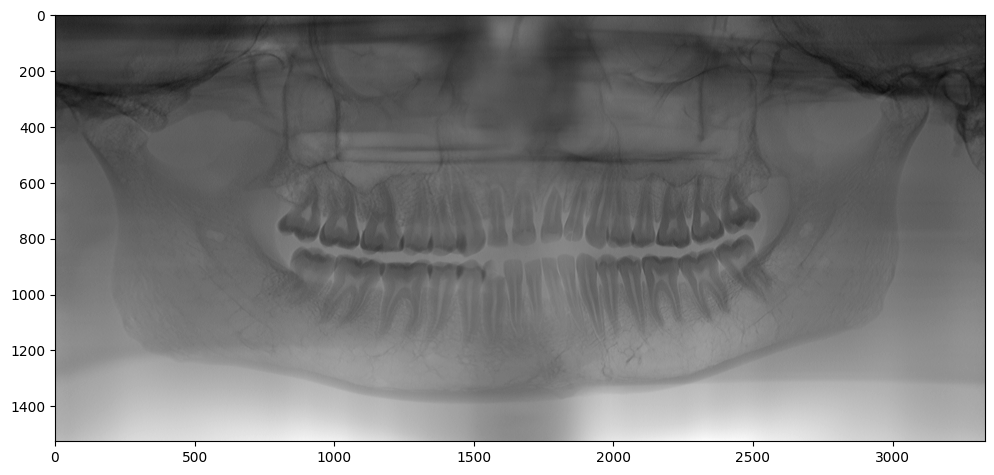

In [27]:
plt.figure(figsize = (12,12))
plt.imshow(ans, cmap = 'gray')
plt.show()

In [30]:
import numpy as np

In [31]:
data = np.array(ans *255 , dtype = np.uint8)

In [32]:
cv2.

array([[ 35,  33,  35, ...,  58,  56,  56],
       [ 37,  36,  37, ...,  59,  55,  55],
       [ 38,  38,  37, ...,  56,  51,  54],
       ...,
       [187, 188, 185, ..., 188, 188, 187],
       [185, 187, 187, ..., 188, 188, 189],
       [187, 187, 187, ..., 188, 187, 188]], dtype=uint8)

In [40]:
img_gaussianBlur = cv2.GaussianBlur(data, (3, 3), 1)
clahe = cv2.createCLAHE(40.0, (12,12))
img = clahe.apply(img_gaussianBlur)

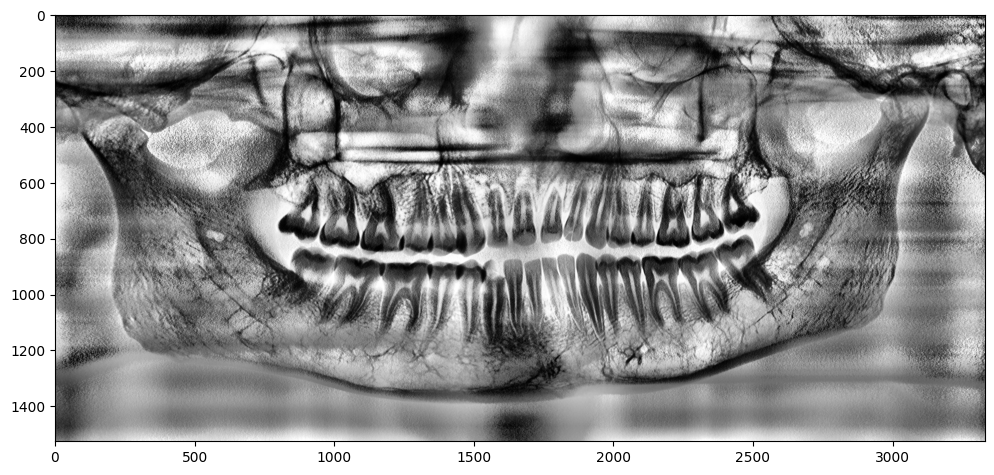

In [41]:
plt.figure(figsize=(12,12))
plt.imshow(img, cmap = 'gray')
plt.show()

In [86]:
label = torch.zeros((2,1,512,1024))
pred = torch.ones((2,1,512,1024))

In [87]:
loss = torch.nn.MSELoss(reduction='mean')

In [88]:
l1 = torch.nn.L1Loss()

In [89]:
l1(label, pred)

tensor(1.)

In [92]:
def MLELoss(x, y):
    return torch.mean( y*torch.sqrt((x - y)**2))

In [93]:
MLELoss(label, pred)

tensor(1.)

In [91]:
torch.sqrt

<function torch._VariableFunctionsClass.sqrt>

# test log变换

In [183]:
image

tensor([[[[0.0235, 0.0118, 0.0235,  ..., 0.9686, 0.9255, 0.9255],
          [0.0510, 0.0353, 0.0510,  ..., 0.9804, 0.8941, 0.8941],
          [0.0745, 0.0745, 0.0510,  ..., 0.9255, 0.6588, 0.8510],
          ...,
          [0.5333, 0.5686, 0.4627,  ..., 0.7804, 0.7804, 0.7294],
          [0.4627, 0.5333, 0.5333,  ..., 0.7804, 0.7804, 0.8353],
          [0.5333, 0.5333, 0.5333,  ..., 0.7804, 0.7294, 0.7804]]]])

In [187]:
def log10(image):
    image = torch.log10(image + 1e-8)
    return image

def loge(image):
    image = torch.log(image + 1e-8)
    return image

def log2(image):
    image = torch.log2(image + 1e-8)
    return image

In [194]:
torch.log1p

<function torch._VariableFunctionsClass.log1p>

In [34]:
image1 = log10(image)
image1 = enchance(normalized(image1))

torch.Size([1, 28, 28, 4, 1, 256]) torch.Size([1, 28, 28, 4, 1, 6545])


In [7]:
import numpy as np

In [216]:
file_path = r'D:\dataset\fussen\kunlun2\60-4-1\1.2.826.0.1.3680043.2.461.14085263.610332026.raw'
file_path = r'D:\dataset\fussen\kunlun2\100-9-1\1.2.826.0.1.3680043.2.461.14085266.2487872269.raw'
#file_path = r'D:\dataset\fussen\kunlun2\90-7-2\1.2.826.0.1.3680043.2.461.14085258.2910576680.raw'
ans = raw2normal(file_path)
image = torch.from_numpy( ans ).unsqueeze(0).unsqueeze(0).to(torch.float32)
#image = gamma(image,0.5)
#image = enchance(image)

In [217]:
# image[:1200, :] = log10(image[:1200,:])
image[1200:, :] = gamma(image[1200:,:], 0.5)

In [218]:
image = normalized(image)
image = enchance(image)

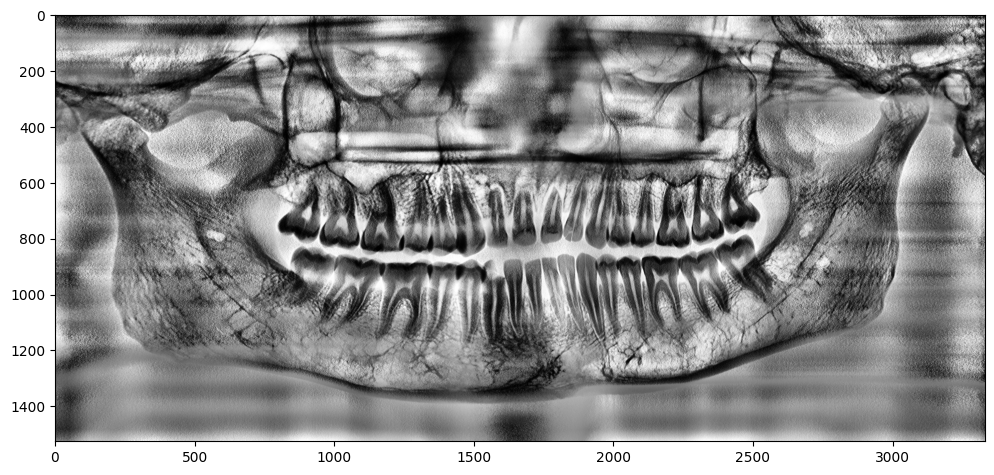

In [219]:
plt.figure(figsize=(12,12))
plt.imshow(image.squeeze(), cmap = 'gray')
plt.show()

In [220]:
def getFileList(dir_path, file_list, ext = None):
    """
    递归遍历dir path下所有 获取文件夹及其子文件夹中文件 带ext的文件列表
    param dir_path: 文件夹根目录
    param file_list: 文件list地址
    param ext: 扩展名
    返回： 文件路径列表
    """
    newDir = dir_path
    if os.path.isfile(dir_path):
        if ext is None:
            file_list.append(dir_path)
        else:
            if ext in dir_path[-3:]:
                file_list.append(dir_path)
    
    elif os.path.isdir(dir_path):
        for s in os.listdir(dir_path):
            newDir=os.path.join(dir_path,s)
            getFileList(newDir, file_list, ext)
 
    return file_list


In [224]:
path = r"D:\dataset\eye\Train\Train/"
file_list = []
file_list = getFileList(path, file_list, "jpg")

In [225]:
file_list[0]

'D:\\dataset\\eye\\Train\\Train/0_L\\0.jpg'

In [231]:
file_obj = file_list[0][len(path):].replace("\\",'/').split("/")

In [232]:
folder = file_obj[0]
name = file_obj[1]

In [238]:
folder, name

('0_L', '0.jpg')